# **Projet de Plan d'expériences et collecte et stockage de données**

Nous avons choisi comme sujet l'**Identification des facteurs expliquant la sous-représentation des femmes parmi les lauréats des Prix Nobel**.

Notre but est l'élaboration d’une base de données sur les lauréat.e.s du Prix Nobel qui pourra être utilisée dans une analyse statistique des caractéristiques-types des lauréat.e.s en fonction de leur genre.
Nous allons pour ce faire utiliser la technique du Web-Scraping. 
Si possible, nous extrairons des données de la population mondiale pour re-contextualiser la remise d’un Prix Nobel.

Notre base de données regroupera donc des facteurs que nous pensons être pertinents par rapport à notre étude, c'est-à-dire: 

* le sexe du lauréat
* la nationalité du lauréat
* la date de naissance du lauréat
* la religion du lauréat
* la catégorie du Prix Nobel attribué
* la composition du Comité Nobel (jury) l'année d'attribution du Prix
* des statistiques sur l'âge et le pays d'origine du lauréat (taux d'alphabétisation totale, taux d'alphabétisation des femmes, nombre des analphabètes, nombre des femmes et hommes non scolarisés, nombre de chercheurs et pourcentage des femmes chercheuses...)
* etc...


### Imports nécessaires au projet

In [ ]:
import requests
from bs4 import BeautifulSoup
import json
import pandas as pd
import matplotlib.pyplot as plt

!pip3 install wikipedia-api
import wikipediaapi

!pip install pymongo
from pymongo import MongoClient 

!apt install mongodb >log
!service mongodb start

  Created wheel for wikipedia-api: filename=Wikipedia_API-0.5.4-cp37-none-any.whl size=13462 sha256=ce0c0adbdfff0647168895df5ac140806ce7630a857b00b3bc53c0575236d13c
  Stored in directory: /root/.cache/pip/wheels/bf/40/42/ba1d497f3712281b659dd65b566fc868035c859239571a725a
Successfully built wikipedia-api


 * Starting database mongodb
   ...done.


##Collecte de données sur les lauréats

###Webscraping des données sur les lauréats

Nous allons utiliser les données du site officiel du Prix Nobel : https://www.nobelprize.org/. 

In [ ]:
#Ici on a des informations sur les lauréats depuis l'api du site officiel
url = "https://masterdataapi.nobelprize.org/2.0/laureates?limit=1000"
 
response = requests.get(url)

print(response)# 200 => connecté avec succès !!!

<Response [200]>


In [ ]:
data = response.text
parsed = json.loads(data)

print(json.dumps(parsed, indent=4))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
#La taille de ce dataset
laureates = parsed["laureates"]
len(laureates)

955

In [ ]:
#Voici les features de cette API:
for key, value in laureates[2].items():
      print("Feature :", key)

Feature : id
Feature : knownName
Feature : givenName
Feature : familyName
Feature : fullName
Feature : gender
Feature : birth
Feature : wikipedia
Feature : wikidata
Feature : sameas
Feature : links
Feature : nobelPrizes


In [ ]:
#On supprime les colonnes jugées inutiles
for i in range (len(laureates)) :
    del laureates[i]['id']
    del laureates[i]['wikipedia']
    del laureates[i]['wikidata']
    del laureates[i]['links']
    del laureates[i]['sameas']

In [ ]:
#Ici on a des informations sur les prix nobels depuis l'api du site officiel
url2 = "https://api.nobelprize.org/2.0/nobelPrizes?limit=1000"
 
response2 = requests.get(url2)

print(response2)# 200 => connecté avec succès !!!

<Response [200]>


In [ ]:
data2 = response2.text
parsed2 = json.loads(data2)

print(json.dumps(parsed2, indent=4))

{
    "nobelPrizes": [
        {
            "awardYear": "1901",
            "category": {
                "en": "Chemistry",
                "no": "Kjemi",
                "se": "Kemi"
            },
            "categoryFullName": {
                "en": "The Nobel Prize in Chemistry",
                "no": "Nobelprisen i kjemi",
                "se": "Nobelpriset i kemi"
            },
            "prizeAmount": 150782,
            "prizeAmountAdjusted": 8722510,
            "links": {
                "rel": "nobelPrize",
                "href": "https://api.nobelprize.org/2/nobelPrize/che/1901",
                "action": "Get",
                "types": "application/json"
            },
            "laureates": [
                {
                    "id": "160",
                    "knownName": {
                        "en": "Jacobus H. van 't Hoff"
                    },
                    "portion": "1",
                    "sortOrder": "1",
                    "motivation": {

In [ ]:
#La taille de ce dataset
nobelPrizes = parsed2["nobelPrizes"]
len(nobelPrizes)


652

In [ ]:
#Voici les features de la seconde API 
#Puisque ces caractéristiques sont les mêmes que celle de l'API précédente, on se contente de ce qu'on a déjà  
for key, value in nobelPrizes[1].items():
      print("Feature :", key)

Feature : awardYear
Feature : category
Feature : categoryFullName
Feature : prizeAmount
Feature : prizeAmountAdjusted
Feature : links
Feature : laureates


###Web scraping sur les religions des lauréats

In [ ]:
page = requests.get('https://en.wikipedia.org/wiki/List_of_nonreligious_Nobel_laureates')
soup = BeautifulSoup(page.text, 'html.parser')
tables = soup.find_all('table', {"class" : 'wikitable'} )
nonreligious = []
for table in tables :
    #2 eme tr
    trs = table.findAll('tr')
    tr2 = trs[1:]
    #3 eme td
    for tr in tr2 :
        tds = tr.find_all('td')
        td3 = tds[1]
        #a
        a_title = td3.find('a')['title']
        nonreligious.append(a_title)
        #a.title
        print(a_title)

        
ul = soup.find('a', {'title' : 'Norman Angell'}).parent.parent
lis = ul.find_all('li')
for li in lis :
    #a
    a_title = li.find('a')['title']
    nonreligious.append(a_title)
    #a.title
    print(a_title)
    
ul = soup.find('a', {'title' : 'Samuel Beckett'}).parent.parent
lis = ul.find_all('li')
for li in lis :
    #a
    a_title = li.find('a')['title']
    nonreligious.append(a_title)
    #a.title
    print(a_title)

Zhores Alferov
Philip Warren Anderson
John Bardeen
Hans Bethe
Patrick Blackett
Nicolaas Bloembergen
Niels Bohr
Percy Williams Bridgman
Louis de Broglie
James Chadwick
Marie Curie
Pierre Curie
Paul Dirac
Albert Einstein
Enrico Fermi
Richard Feynman
Val Logsdon Fitch
James Franck
Murray Gell-Mann
Riccardo Giacconi
Ivar Giaever
Vitaly Ginzburg
Sheldon Lee Glashow
Roy J. Glauber
David Gross
Serge Haroche
Peter Higgs
Masatoshi Koshiba
J. Michael Kosterlitz
Herbert Kroemer
Lev Landau
Leon M. Lederman
Michel Mayor
Albert A. Michelson
Konstantin Novoselov
Jim Peebles
Jean Baptiste Perrin
Didier Queloz
Isidor Isaac Rabi
Brian Schmidt
Erwin Schrödinger
William Shockley
Jack Steinberger
Igor Tamm
Kip Thorne
Johannes Diderik van der Waals
Martinus J. G. Veltman
Steven Weinberg
Eugene Wigner
Svante Arrhenius
Paul D. Boyer
John Cornforth
Marie Curie
Frédéric Joliot-Curie
Irène Joliot-Curie
Herbert A. Hauptman
Roald Hoffmann
Harry Kroto
Jean-Marie Lehn
Peter D. Mitchell
George Andrew Olah
Wilhelm Ost

In [ ]:
page = requests.get('https://en.wikipedia.org/wiki/List_of_Jewish_Nobel_laureates')
soup = BeautifulSoup(page.text, 'html.parser')
tables = soup.find_all('table', {"class" : 'wikitable'} )
jewish = []
for table in tables :
    #2 eme tr
    trs = table.findAll('tr')
    tr2 = trs[1:]
    #3 eme td
    for tr in tr2 :
        tds = tr.find_all('td')
        if len(tds) == 5 :
            td3 = tds[2]
        else :
            continue
        #a
        a_title = td3.find('a')['title']
        jewish.append(a_title)
        #a.title
        print(a_title)

Adolf von Baeyer
Henri Moissan
Otto Wallach
Richard Willstätter
Fritz Haber
George de Hevesy
Melvin Calvin
Max Perutz
Christian B. Anfinsen
Ilya Prigogine
Herbert C. Brown
Paul Berg
Roald Hoffmann
Aaron Klug
Jerome Karle
John Polanyi
Sidney Altman
Rudolph A. Marcus
George Andrew Olah
Harry Kroto
Walter Kohn
Alan J. Heeger
Aaron Ciechanover
Roger D. Kornberg
Martin Chalfie
Ada Yonath
Dan Shechtman
Robert Lefkowitz
Arieh Warshel
Élie Metchnikoff
Robert Bárány
Otto Fritz Meyerhof
Karl Landsteiner
Otto Heinrich Warburg
Otto Loewi
Joseph Erlanger
Ernst Boris Chain
Hermann Joseph Muller
Gerty Cori
Tadeus Reichstein
Selman Waksman
Hans Adolf Krebs
Joshua Lederberg
Arthur Kornberg
Konrad Emil Bloch
François Jacob
George Wald
Marshall Warren Nirenberg
Salvador Luria
Julius Axelrod
Gerald Edelman
David Baltimore
Baruch Samuel Blumberg
Rosalyn Sussman Yalow
Daniel Nathans
Baruj Benacerraf
John Vane
César Milstein
Michael Stuart Brown
Stanley Cohen (biochemist)
Gertrude B. Elion
Harold E. Varmus
A

In [ ]:
page = requests.get('https://en.wikipedia.org/wiki/List_of_Muslim_Nobel_laureates')
soup = BeautifulSoup(page.text, 'html.parser')
tables = soup.find_all('table', {"class" : 'wikitable'} )
muslim = []
for table in tables :
    #2 eme tr
    trs = table.findAll('tr')
    tr2 = trs[1:]
    #3 eme td
    for tr in tr2 :
        tds = tr.find_all('td')
        td3 = tds[2]
        #a
        a_title = td3.find('a')['title']
        muslim.append(a_title)
        #a.title
        print(a_title)

Ahmed Zewail
Aziz Sancar
Naguib Mahfouz
Orhan Pamuk
Anwar al-Sadat
Yasser Arafat
Shirin Ebadi
Mohamed El Baradei
Muhammad Yunus
Tawakel Karman
Malala Yousafzai
Mohammad Abdus Salam


In [ ]:
page = requests.get('https://en.wikipedia.org/wiki/List_of_Christian_Nobel_laureates')
soup = BeautifulSoup(page.text, 'html.parser')
tables = soup.find_all('table', {"class" : 'wikitable'} )
christian = []
for table in tables :
    #2 eme tr
    trs = table.findAll('tr')
    tr2 = trs[1:]
    #3 eme td
    for tr in tr2 :
        tds = tr.find_all('td')
        if len(tds) == 6 :
            td3 = tds[2]
            a_title = td3.find('a')['title']
            christian.append(a_title)
            print(a_title)

John Strutt, 3rd Baron Rayleigh
J. J. Thomson
Guglielmo Marconi
Max von Laue
Charles Glover Barkla
Robert Andrews Millikan
Arthur Compton
Werner Heisenberg
Victor Francis Hess
Ernest Walton
Charles Hard Townes
Antony Hewish
William Daniel Phillips
Peter Grünberg
Fritz Haber
Richard Smalley
Gerhard Ertl
Santiago Ramón y Cajal
Emil Theodor Kocher
Alexis Carrel
Karl Landsteiner
Gerty Cori
John Eccles (neurophysiologist)
Werner Arber
Ferid Murad
John Gurdon
Theodor Mommsen
Bjørnstjerne Bjørnson
Frédéric Mistral
Henryk Sienkiewicz
Selma Lagerlöf
Paul Heyse
Verner von Heidenstam
W. B. Yeats
Władysław Reymont
Grazia Deledda
Sigrid Undset
Thomas Mann
Ivan Bunin
Pearl S. Buck
Gabriela Mistral
Hermann Hesse
André Gide
T. S. Eliot
William Faulkner
François Mauriac
Winston Churchill
Ernest Hemingway
Halldór Laxness
Juan Ramón Jiménez
Boris Pasternak
Ivo Andrić
John Steinbeck
Giorgos Seferis
Miguel Ángel Asturias
Aleksandr Solzhenitsyn
Heinrich Böll
Odysseas Elytis
Czesław Miłosz
Gabriel García Már

In [ ]:
df1 = pd.DataFrame({'name' : nonreligious, 'religion' : 'nonreligious'})
df2 = pd.DataFrame({'name' : jewish, 'religion' : 'jewish'})
df3 = pd.DataFrame({'name' : muslim, 'religion' : 'muslim'})
df4 = pd.DataFrame({'name' : christian, 'religion' : 'christian'})
df5 = pd.concat([df1, df2, df3, df4], ignore_index=True)
pd.set_option('display.max_rows', df5.shape[0]+1)
print(df5)

                                    name      religion
0                         Zhores Alferov  nonreligious
1                 Philip Warren Anderson  nonreligious
2                           John Bardeen  nonreligious
3                             Hans Bethe  nonreligious
4                       Patrick Blackett  nonreligious
5                   Nicolaas Bloembergen  nonreligious
6                             Niels Bohr  nonreligious
7                Percy Williams Bridgman  nonreligious
8                       Louis de Broglie  nonreligious
9                         James Chadwick  nonreligious
10                           Marie Curie  nonreligious
11                          Pierre Curie  nonreligious
12                            Paul Dirac  nonreligious
13                       Albert Einstein  nonreligious
14                          Enrico Fermi  nonreligious
15                       Richard Feynman  nonreligious
16                     Val Logsdon Fitch  nonreligious
17        

In [ ]:
for i in range(len(laureates)):
    if 'knownName' in laureates[i]:
        #print(laureates[i]['knownName']['en'])
        for k in range(len(df5)) :
            if laureates[i]['knownName']['en'] == df5.name[k] :
                laureates[i]['religion'] = df5.religion[k]
laureates

[{'birth': {'date': '1943-00-00',
   'place': {'city': {'en': 'Montclair, NJ',
     'no': 'Montclair, NJ',
     'se': 'Montclair, NJ'},
    'cityNow': {'en': 'Montclair, NJ',
     'no': 'Montclair, NJ',
     'sameas': ['https://www.wikidata.org/wiki/Q678437',
      'https://www.wikipedia.org/wiki/Montclair,_New_Jersey'],
     'se': 'Montclair, NJ'},
    'continent': {'en': 'North America'},
    'country': {'en': 'USA', 'no': 'USA', 'se': 'USA'},
    'countryNow': {'en': 'USA',
     'no': 'USA',
     'sameas': ['https://www.wikidata.org/wiki/Q30'],
     'se': 'USA'},
    'locationString': {'en': 'Montclair, NJ, USA',
     'no': 'Montclair, NJ, USA',
     'se': 'Montclair, NJ, USA'}}},
  'familyName': {'en': 'Spence', 'se': 'Spence'},
  'fullName': {'en': 'A. Michael Spence', 'se': 'A. Michael Spence'},
  'gender': 'male',
  'givenName': {'en': 'A. Michael', 'se': 'A. Michael'},
  'knownName': {'en': 'A. Michael Spence', 'se': 'A. Michael Spence'},
  'nobelPrizes': [{'affiliations': [{'c

### Web scraping des informations sur les universités d'étude des lauréats

In [ ]:
page = requests.get('https://fr.wikipedia.org/wiki/Liste_des_laur%C3%A9ats_du_prix_Nobel_par_universit%C3%A9')
soup = BeautifulSoup(page.text, 'html.parser')

#On prend les éléments du tableau
tableau = soup.find('table', attrs={'class':'wikitable sortable'})
lignes = tableau.find_all('tr') #chaque ligne du tableau. 

Chaque ligne est composée soit d'une explication des colonnes, soit du nom de l'université soit des noms de ses élèves/chercheurs
Le problème est que les explications de colonnes ne sont pas uniformément réparties (on les retrouve toutes les 
3 lignes au début, moins souvent ensuite)

#### Nettoyage des données

D'abord on essaye d'enlever toutes les explications de colonne, pour avoir ensuite les noms d'université et noms des élèves répartis régulièrement.

In [ ]:
infosInteret = []
for ligne in lignes:
    ecrit = ligne.find_all('td')
    #Pour les explications de colonne, ecrit est vide
    #On supprime donc ces lignes pour seulement avoir les infos qui nous interessent
    if(len(ecrit)!=0):
        infosInteret.append(ecrit)      

On a aussi une ligne vide : l'unversité de Mount Sinai School of Medicine n'est associé à aucune personne On retire donc la ligne associée à cette université de la liste. Au contraire pour l'université de Toulouse on a 2 lignes pour les étudiants. La deuxième de ces deux lignes nous indique simplement que Rosalyn Yalow y a travaillé après avoir reçu son prix Nobel. Cette information ne nous ait pas utile donc on va supprimer cette ligne aussi.

In [ ]:
#nettoyage des données :
if len(infosInteret)==392:
    del(infosInteret[-5])

numligne_suppr = 0
univ_trouvée = False

for i in range(len(infosInteret)):
    elem = infosInteret[i][0].find_all('a')
    if len(elem)>0 and "Mount Sinai School of Medicine" in elem[0]:
        numligne_suppr = i
        univ_trouvée = True

if(univ_trouvée):
    del(infosInteret[numligne_suppr])

#### Récupération des informations

In [ ]:
etude = []

for i in range(len(infosInteret)):
    if i%2 == 0: #une ligne sur deux concerne les noms d'universités
        nom = infosInteret[i][0].find_all('a')
        nom_univ = nom[0].contents
    else:         #une ligne sur deux contient le nom des lauréats diplomés de cette université
        ligne = infosInteret[i]
        noms_diplomes = []
        info_diplome = ligne[1].find_all('a') #liste des lauréats diplomés de cette université

        for element in info_diplome:
            laureat = element.contents[0]
            etude.append([laureat, nom_univ[0]])  #on concatene les infos du nom de lauréat et du nom de l'université
print(etude)

[['Robert A. Millikan', 'Université Columbia'], ['Nicholas Murray Butler', 'Université Columbia'], ['Irving Langmuir', 'Université Columbia'], ['Isidor Isaac Rabi', 'Université Columbia'], ['John Howard Northrop', 'Université Columbia'], ['Hermann Joseph Muller', 'Université Columbia'], ['Edward Calvin Kendall', 'Université Columbia'], ['Dickinson W. Richards', 'Université Columbia'], ['Joshua Lederberg', 'Université Columbia'], ['Konrad Bloch', 'Université Columbia'], ['Julian Schwinger', 'Université Columbia'], ['George Wald', 'Université Columbia'], ['Simon Kuznets', 'Université Columbia'], ['William H. Stein', 'Université Columbia'], ['Kenneth Arrow', 'Université Columbia'], ['Leon Neil Cooper', 'Université Columbia'], ['James Rainwater', 'Université Columbia'], ['Baruch Blumberg', 'Université Columbia'], ['Milton Friedman', 'Université Columbia'], ['Arno Penzias', 'Université Columbia'], ['Baruj Benacerraf', 'Université Columbia'], ['Val Fitch', 'Université Columbia'], ['Roald Hof

In [ ]:
for i in range(len(laureates)):
    if 'knownName' in laureates[i]:
        for k in range(len(etude)) :
            if laureates[i]['knownName']['en'] == etude[k][0] :
                laureates[i]['universiteEtude'] = etude[k][1]
laureates

[{'birth': {'date': '1943-00-00',
   'place': {'city': {'en': 'Montclair, NJ',
     'no': 'Montclair, NJ',
     'se': 'Montclair, NJ'},
    'cityNow': {'en': 'Montclair, NJ',
     'no': 'Montclair, NJ',
     'sameas': ['https://www.wikidata.org/wiki/Q678437',
      'https://www.wikipedia.org/wiki/Montclair,_New_Jersey'],
     'se': 'Montclair, NJ'},
    'continent': {'en': 'North America'},
    'country': {'en': 'USA', 'no': 'USA', 'se': 'USA'},
    'countryNow': {'en': 'USA',
     'no': 'USA',
     'sameas': ['https://www.wikidata.org/wiki/Q30'],
     'se': 'USA'},
    'locationString': {'en': 'Montclair, NJ, USA',
     'no': 'Montclair, NJ, USA',
     'se': 'Montclair, NJ, USA'}}},
  'familyName': {'en': 'Spence', 'se': 'Spence'},
  'fullName': {'en': 'A. Michael Spence', 'se': 'A. Michael Spence'},
  'gender': 'male',
  'givenName': {'en': 'A. Michael', 'se': 'A. Michael'},
  'knownName': {'en': 'A. Michael Spence', 'se': 'A. Michael Spence'},
  'nobelPrizes': [{'affiliations': [{'c

###Web scraping des données sur la situation familiale des lauréats


Nous installons et puis importons l'api wikipedia.

Nous nous assurons que la page souhaitée existe.

In [ ]:
wiki_wiki = wikipediaapi.Wikipedia('fr')
page_py = wiki_wiki.page('Liste des lauréats du prix Nobel')
print("Page - Exists: %s" % page_py.exists())

Page - Exists: True


Nous affichons les sections de la page 'Liste des lauréats du prix Nobel' depuis Wikipedia ainsi que son URL.

In [ ]:
def print_sections(sections, level=0):
        for s in sections:
                print("%s: %s - %s" % ("*" * (level + 1), s.title, s.text[0:40]))
                print_sections(s.sections, level + 1)


print_sections(page_py.sections)
print(page_py.fullurl)

*: Liste des récipiendaires - 
*: Notes et références - 
**: Notes - A  En 1938 et 1939, les trois candidats 
**: Références - 
*: Voir aussi - 
**: Articles connexes - Liste des lauréats du prix Nobel par pay
**: Liens externes - Site internet officiel de l'Académie roy
https://fr.wikipedia.org/wiki/Liste_des_r%C3%A9cipiendaires_du_prix_Nobel


Nous récupèrons les liens des pages des lauréats de la section 'Liste des récipiendaires'.

In [ ]:
laureats=[]
def print_links(page):
        links = page.links
        for title in sorted(links.keys()):
            page_laureate = wiki_wiki.page(title)
            print(title)
            laureats.append(page_laureate)
print_links(page_py)

Aage Bohr
Aaron Ciechanover
Aaron Klug
Abdus Salam
Abhijit Banerjee
Abiy Ahmed
Académie royale des sciences de Suède
Académie suédoise
Accords de paix de Paris
Ada Yonath
Adam Riess
Adolf Butenandt
Adolf Otto Reinhold Windaus
Adolf von Baeyer
Adolfo Pérez Esquivel
Agriculture
Ahmed Zewail
Akira Suzuki
Akira Yoshino
Al Gore
Alan J. Heeger
Alan Lloyd Hodgkin
Alan MacDiarmid
Albert Abraham Michelson
Albert Camus
Albert Claude
Albert Einstein
Albert Fert
Albert Gobat
Albert Lutuli
Albert Schweitzer
Albert Szent-Györgyi
Albrecht Kossel
Aleksandr Solzhenitsyn
Alekseï Abrikossov
Alexander Fleming
Alexander Robert Todd
Alexandre Mikhaïlovitch Prokhorov
Alexis Carrel
Alfonso García Robles
Alfred G. Gilman
Alfred Hermann Fried
Alfred Hershey
Alfred Kastler
Alfred Nobel
Alfred Werner
Alice Munro
Allan McLeod Cormack
Allvar Gullstrand
Alva Myrdal
Alvin E. Roth
Amartya Sen
American Friends Service Committee
Amnesty International
Anatole France
Andre Geim
Andrea Ghez
Andrei Sakharov
Andrew Fire
Andr

Nous récupèrons le paraghrape 'Biographie' et ceux de la vie personnelle de chaque lauréat s'ils existent.
Ce sont les paragraphes qui peuvent comporter des informations sur la situation familiale.

In [ ]:
bio=dict()
viePerso=dict()
def laureates_bioViePerso():
  count=1
  for laureat in laureats:
    if  count<50:
      for s in laureat.sections:
        if s.title =='Biographie':
          {bio.update({laureat:s.text})}
        elif s.title =='Sa vie' or s.title =='Vie Personnelle' or s.title =='Situation familiale':
          {viePerso.update({laureat:s.text})}
    count=count+1
laureates_bioViePerso()

In [ ]:
print(bio[laureats[0]])

Il est le quatrième fils de Margrethe (née Nørlund) et Niels Bohr, physicien danois pionnier de la mécanique quantique, qui reçut le prix Nobel de physique en 1922. Ayant grandi au milieu de physiciens amis de son père, comme Wolfgang Pauli ou Werner Heisenberg, Aage Niels est devenu un brillant physicien nucléaire.
Il a commencé à étudier la physique à l’université de Copenhague en 1940, quelques mois après l’occupation du Danemark par les Nazis. Dès cette époque, il commence à assister son père pour la correspondance ou la rédaction d’articles de caractère épistémologique, puis progressivement en relation avec son travail en physique.
En octobre 1943, son père est contraint de fuir le Danemark pour éviter d’être arrêté par les nazis et toute la famille parvient à trouver refuge en Suède, où elle fut très chaudement accueillie. Après un passage en Grande-Bretagne, où Niels Bohr est informé du projet Manhattan, il est invité avec son fils Aage à se joindre à l’équipe de recherche de Ro

Nous avons trouvé que c'est très difficile d'extraire des informations particulières sur le background familial (structure familiale, éducation des parents, niveau de vie des parents...) de chaque lauréat,  vu qu'elles peuvent se présenter soit dans la section 'Biographie' sur n'importe quel ligne soit dans la section 'Vie personnelle' ou 'Sa vie' ou 'Situation familiale' qui n'existent pas pour tous les pages de lauréats.

##Collecte de données statistiques dans le monde

### Web scraping des données sur le taux d'alphabétisation par pays en 2015 et 2018

Nous récupèrons la page Wikipedia 'Liste des pays par taux d'alphabétisation'

In [ ]:
page_taux = requests.get('https://fr.wikipedia.org/wiki/Liste_des_pays_par_taux_d%27alphab%C3%A9tisation#Liste_de_la_CIA')
soup = BeautifulSoup(page_taux.text, 'html.parser')

####Le taux d'alphabétisation par genre et par pays en 2015

Nous essayons d'extraire le taux total, de femmes et d'hommes de chaque pays en mettant les données dans des dictionnaire ayant comme clé le nom du pays et comme valeur le taux d'alphabétisation

In [ ]:
tableau = soup.find('table', attrs={'class':'wikitable sortable zebra'})
lignes = tableau.find_all('tr')

In [ ]:
html = []
taux_pays_2015=dict()
taux_pays_femmes=dict()
taux_pays_hommes=dict()
pays_= []
taux_= []
taux_fe=[]
taux_ho=[]
for ligne in lignes:
    colonne = ligne.find_all('td')
    html.append(colonne)  
for i in range(len(html)-2):
  if i>2:
    pays=html[i][0].find_all('a')
    taux=html[i][3].find_all('b')
    taux_f=html[i][2].text
    taux_h=html[i][1].text
    taux_fe.append(taux_f)
    taux_ho.append(taux_h)
    for p in pays:
      if p.text!='':
        pays_.append(p.text)
    for t in taux:
      if p.text!='':
        taux_.append(t.text)
pays_.append('Géorgie')
for i in range(len(pays_)):
  {taux_pays_2015.update({pays_[i]:taux_[i]})}
  {taux_pays_femmes.update({pays_[i]:taux_fe[i]})}
  {taux_pays_hommes.update({pays_[i]:taux_ho[i]})}
  print(taux_fe[i])

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

>99,9 %

99,8 %

99,7 %

99,8 %

99,8 %

99,8 %

99,8 %

99,7 %

99,8 %

99,7 %

99,7 %

99,8 %

99,7 %

99,7 %

99,6 %

99,5 %

99,6 %

99,4 %

99,1 %

99,4 %

98,8 %

98,9 %

99,0 %

99,1 %

98,7 %

99,1 %

98,7 %

98,5 %

98,0 %

97,7 %

97,5 %

98,1 %

98,6 %

98,7 %

98,1 %

97,2 %

97,5 %

97,8 %

96,8 %

97,4 %

96,9 %

96,8 %

97,2 %

95,1 %

95,2 %

96,7 %

95,1 %

94,5 %

95,8 %

94,6 %

96,8 %

93,5 %

93,6 %

95,0 %

95,0 %

94,1 %

95,7 %

93,0 %

95,7 %

91,8 %

94,4 %

91,2 %

94,8 %

91,1 %

93,2 %

93,5 %

91,7 %

92,8 %

93,3 %

93,1 %

95,7 %

91,5 %

91,8 %

95,8 %

93,8 %

91,2 %

92,9 %

91,7 %

87,5 %

92,3 %

85,6 %

88,5 %

93,1 %

88,9 %

89,8 %

88,6 %

86,4 %

83,1 %

87,5 %

82,5 %

84,6 %

81,0 %

82,7 %

83,1 %

83,8 %

79,1 %

81,0 %

83,2 %


####Le taux total d'alphabétisation par pays en 2018

Nous procédons de la même manière qu'en 2015

In [ ]:
tableau_ = soup.find('table', attrs={'class':'sortable wikitable'})
lignes_ = tableau_.find_all('tr')

In [ ]:
html_ = []
taux_pays_2018=dict()
pays_2018= []
taux_2018= []
for ligne in lignes_:
    colonne = ligne.find_all('td')
    html_.append(colonne) 
#print(html_)  
for i in range(len(html_)):
  if i>0:
    pays=html_[i][2].find_all('a')
    taux=html_[i][3].text
    taux_2018.append(taux)
    #print(taux)
    for p in pays:
      if p.text!='':
        #print(p.text)
        pays_2018.append(p.text)   
print(pays_)
print(taux_)
for i in range(len(pays_2018)):
  taux_pays_2018.update({pays_2018[i]:taux_2018[i]})
  print(taux_2018[i])

['Allemagne', 'Australie', 'Autriche', 'Belgique', 'Canada', 'Corée du Nord', 'Corée du Sud', 'Danemark', 'États-Unis', 'Finlande', 'France', 'Hong Kong', 'Irlande', 'Islande', 'Israël', 'Japon', 'Lettonie', 'Luxembourg', 'Norvège', 'Nouvelle-Zélande', 'Pays-Bas', 'Suède', 'Suisse', 'Tchéquie', 'Royaume-Uni', 'Arménie', 'Azerbaïdjan', 'Estonie', 'Géorgie', 'Kazakhstan', 'Lituanie', 'Pologne', 'Tadjikistan', 'Ukraine', 'Biélorussie', 'Cuba', 'Russie', 'Slovénie', 'Slovaquie', 'Ouzbékistan', 'Palaos', 'Kirghizistan', 'Moldavie', 'Tonga', 'Maldives', 'Croatie', 'Italie', 'Hongrie', 'Chypre', 'Samoa', 'Trinité-et-Tobago', 'Roumanie', 'Monténégro', 'Taïwan', 'Bosnie-Herzégovine', 'Bulgarie', 'Mongolie', 'Uruguay', 'Argentine', 'Serbie', 'Espagne', 'Costa Rica', 'Macédoine du Nord', 'Qatar', 'Grèce', 'Albanie', 'Chili', 'Singapour', 'Jordanie', 'Thaïlande', 'Bahreïn', 'Chine', 'Koweït', 'Macao', 'Philippines', 'Bahreïn', 'Bolivie', 'Paraguay', 'Suriname', 'Portugal', 'Venezuela', 'Guinée équ

####Regroupement de données

In [ ]:
df_statistiques_pays_2015 = pd.DataFrame({'taux_alphabétisation_2015':taux_, 'taux_alphabétisation_2015_femmes':taux_fe, 'taux_alphabétisation_2015_hommes':taux_ho})
df_statistiques_pays_2015.index=pays_
print(df_statistiques_pays_2015.head())
df_statistiques_pays_2018 = pd.DataFrame({'taux_alphabétisation_2018':taux_2018})
df_statistiques_pays_2018.index=pays_2018
print(df_statistiques_pays_2018.head())

          taux_alphabétisation_2015  ... taux_alphabétisation_2015_hommes
Allemagne                   >99,9 %  ...                        >99,9 %\n
Australie                   >99,9 %  ...                        >99,9 %\n
Autriche                    >99,9 %  ...                        >99,9 %\n
Belgique                    >99,9 %  ...                        >99,9 %\n
Canada                      >99,9 %  ...                        >99,9 %\n

[5 rows x 3 columns]
         taux_alphabétisation_2018
Géorgie                 100,00 %\n
Cuba                     99,97 %\n
Estonie                  99,87 %\n
Lettonie                 99,86 %\n
Barbade             99,79 %[n 1]\n


Nous n'avons pas rajouté ces statistiques dans notre base de données vu qu'elles sont uniquement réparties en 2015 et 2018, ce qui va entraîner la présence de plusieurs valeurs manquantes dans la collention des statistiques mondiales.

### Web scraping des données sur le nombre et le poucentage des analphabètes par genre et année (1970 - 2019)

####Le nombre total 

Nous importons les données à partir de la page UNESCO

In [ ]:
page_tauxw = requests.get('http://data.uis.unesco.org/RestSDMX/sdmx.ashx/GetData/NATMON_DS/ILLPOP_AG15T24.40510/all?startTime=1970&endTime=2020')
soupw = BeautifulSoup(page_tauxw.content, 'lxml')
illiterate_numbers= soupw.find_all('obs')
illiterate_numbers

[<obs><time>1975</time><obsvalue value="172562992"></obsvalue><attributes><value concept="OBS_STATUS" value="‡"></value></attributes></obs>,
 <obs><time>1976</time><obsvalue value="176005561"></obsvalue><attributes><value concept="OBS_STATUS" value="‡"></value></attributes></obs>,
 <obs><time>1977</time><obsvalue value="178063495"></obsvalue></obs>,
 <obs><time>1978</time><obsvalue value="177257929"></obsvalue></obs>,
 <obs><time>1979</time><obsvalue value="176650753"></obsvalue></obs>,
 <obs><time>1980</time><obsvalue value="176601527"></obsvalue></obs>,
 <obs><time>1981</time><obsvalue value="176948219"></obsvalue></obs>,
 <obs><time>1982</time><obsvalue value="176656796"></obsvalue></obs>,
 <obs><time>1983</time><obsvalue value="177802330"></obsvalue></obs>,
 <obs><time>1984</time><obsvalue value="177812080"></obsvalue></obs>,
 <obs><time>1985</time><obsvalue value="178028742"></obsvalue></obs>,
 <obs><time>1986</time><obsvalue value="177963520"></obsvalue></obs>,
 <obs><time>1987</

Nous essayons d'extraire le nombre total des analphabètes pour chaque année en mettant les données dans un dictionnaire ayant comme clé l'année courante et comme valeur le nombre des analphabètes

In [ ]:
taux_world=dict()
numbers=[]
for i in range(5):
  numbers.append('None')
years=[]
year=1970
for i in range(5):
  years.append(year)
  year=year+1
for i in range(len(illiterate_numbers)):
  an=illiterate_numbers[i].find_all('time')
  number=illiterate_numbers[i].find_all('obsvalue')
  a=an[0].text
  n=number[0].get('value')
  years.append(a)
  numbers.append(n)
for i in range (len(numbers)):
  taux_world.update({years[i]:str(numbers[i])})
taux_world

{1970: 'None',
 1971: 'None',
 1972: 'None',
 1973: 'None',
 1974: 'None',
 '1975': '172562992',
 '1976': '176005561',
 '1977': '178063495',
 '1978': '177257929',
 '1979': '176650753',
 '1980': '176601527',
 '1981': '176948219',
 '1982': '176656796',
 '1983': '177802330',
 '1984': '177812080',
 '1985': '178028742',
 '1986': '177963520',
 '1987': '174999694',
 '1988': '171607186',
 '1989': '170706078',
 '1990': '169285426',
 '1991': '168054942',
 '1992': '166029657',
 '1993': '164299476',
 '1994': '162229317',
 '1995': '160301768',
 '1996': '158743746',
 '1997': '151297094',
 '1998': '144814025',
 '1999': '143119444',
 '2000': '144979357',
 '2001': '144131153',
 '2002': '140972475',
 '2003': '138133061',
 '2004': '135304722',
 '2005': '135802393',
 '2006': '132477074',
 '2007': '136381141',
 '2008': '127451379',
 '2009': '126886552',
 '2010': '126441617',
 '2011': '123570686',
 '2012': '116613008',
 '2013': '112245559',
 '2014': '107832974',
 '2015': '107205349',
 '2016': '102121103',
 

####Le nombre des femmes

Nous procédons de la même manière afin d'extraire le nombre des femmes analphabètes pour chaque année

In [ ]:
page_tauxf = requests.get('http://data.uis.unesco.org/RestSDMX/sdmx.ashx/GetData/NATMON_DS/ILLPOP_AG15T24_F.40510/all?startTime=1970&endTime=2020')
soupf = BeautifulSoup(page_tauxf.content, 'lxml')
illiterate_numbers_female= soupf.find_all('obs')
illiterate_numbers_female

[<obs><time>1975</time><obsvalue value="111823954"></obsvalue><attributes><value concept="OBS_STATUS" value="‡"></value></attributes></obs>,
 <obs><time>1976</time><obsvalue value="113951591"></obsvalue><attributes><value concept="OBS_STATUS" value="‡"></value></attributes></obs>,
 <obs><time>1977</time><obsvalue value="115061756"></obsvalue></obs>,
 <obs><time>1978</time><obsvalue value="113952710"></obsvalue></obs>,
 <obs><time>1979</time><obsvalue value="112925921"></obsvalue></obs>,
 <obs><time>1980</time><obsvalue value="112080473"></obsvalue></obs>,
 <obs><time>1981</time><obsvalue value="111539283"></obsvalue></obs>,
 <obs><time>1982</time><obsvalue value="110458872"></obsvalue></obs>,
 <obs><time>1983</time><obsvalue value="110702277"></obsvalue></obs>,
 <obs><time>1984</time><obsvalue value="109947274"></obsvalue></obs>,
 <obs><time>1985</time><obsvalue value="109366547"></obsvalue></obs>,
 <obs><time>1986</time><obsvalue value="108618631"></obsvalue></obs>,
 <obs><time>1987</

In [ ]:
taux_world_female=dict()
numbersf=[]
for i in range(5):
  numbersf.append('None')
yearsf=[]
year=1970
for i in range(5):
  yearsf.append(year)
  year=year+1
for i in range(len(illiterate_numbers_female)):
  an=illiterate_numbers_female[i].find_all('time')
  number=illiterate_numbers_female[i].find_all('obsvalue')
  a=an[0].text
  n=number[0].get('value')
  yearsf.append(a)
  numbersf.append(n)
for i in range (len(numbersf)):
  taux_world_female.update({yearsf[i]:str(numbersf[i])})
taux_world_female

{1970: 'None',
 1971: 'None',
 1972: 'None',
 1973: 'None',
 1974: 'None',
 '1975': '111823954',
 '1976': '113951591',
 '1977': '115061756',
 '1978': '113952710',
 '1979': '112925921',
 '1980': '112080473',
 '1981': '111539283',
 '1982': '110458872',
 '1983': '110702277',
 '1984': '109947274',
 '1985': '109366547',
 '1986': '108618631',
 '1987': '106507355',
 '1988': '106281348',
 '1989': '105458456',
 '1990': '104137091',
 '1991': '103193614',
 '1992': '101852757',
 '1993': '101072699',
 '1994': '99380346',
 '1995': '97758884',
 '1996': '96321022',
 '1997': '90873934',
 '1998': '88920951',
 '1999': '87396899',
 '2000': '88397926',
 '2001': '87176448',
 '2002': '85611143',
 '2003': '84326602',
 '2004': '82178359',
 '2005': '83690930',
 '2006': '80884848',
 '2007': '81398027',
 '2008': '77180059',
 '2009': '76311802',
 '2010': '74953589',
 '2011': '72319155',
 '2012': '68311415',
 '2013': '65394230',
 '2014': '62383231',
 '2015': '61239185',
 '2016': '57917033',
 '2017': '56334041',
 '2

####Le nombre des hommes

Nous procédons de la même manière afin d'extraire le nombre des hommes analphabètes pour chaque année

In [ ]:
page_tauxm = requests.get('http://data.uis.unesco.org/RestSDMX/sdmx.ashx/GetData/NATMON_DS/ILLPOP_AG15T24_M.40510/all?startTime=1970&endTime=2020')
soupm = BeautifulSoup(page_tauxm.content, 'lxml')
illiterate_numbers_male= soupm.find_all('obs')
illiterate_numbers_male

[<obs><time>1975</time><obsvalue value="60739038"></obsvalue><attributes><value concept="OBS_STATUS" value="‡"></value></attributes></obs>,
 <obs><time>1976</time><obsvalue value="62053969"></obsvalue><attributes><value concept="OBS_STATUS" value="‡"></value></attributes></obs>,
 <obs><time>1977</time><obsvalue value="63001739"></obsvalue></obs>,
 <obs><time>1978</time><obsvalue value="63305220"></obsvalue></obs>,
 <obs><time>1979</time><obsvalue value="63724832"></obsvalue></obs>,
 <obs><time>1980</time><obsvalue value="64521054"></obsvalue></obs>,
 <obs><time>1981</time><obsvalue value="65408936"></obsvalue></obs>,
 <obs><time>1982</time><obsvalue value="66197924"></obsvalue></obs>,
 <obs><time>1983</time><obsvalue value="67100053"></obsvalue></obs>,
 <obs><time>1984</time><obsvalue value="67864806"></obsvalue></obs>,
 <obs><time>1985</time><obsvalue value="68662195"></obsvalue></obs>,
 <obs><time>1986</time><obsvalue value="69344889"></obsvalue></obs>,
 <obs><time>1987</time><obsval

In [ ]:
taux_world_male=dict()
numbersm=[]
for i in range(5):
  numbersm.append('None')
yearsm=[]
year=1970
for i in range(5):
  yearsm.append(year)
  year=year+1
for i in range(len(illiterate_numbers_male)):
  an=illiterate_numbers_male[i].find_all('time')
  number=illiterate_numbers_male[i].find_all('obsvalue')
  a=an[0].text
  n=number[0].get('value')
  yearsm.append(a)
  numbersm.append(n)
for i in range (len(numbersm)):
  taux_world_male.update({yearsm[i]:str(numbersm[i])})
taux_world_male

{1970: 'None',
 1971: 'None',
 1972: 'None',
 1973: 'None',
 1974: 'None',
 '1975': '60739038',
 '1976': '62053969',
 '1977': '63001739',
 '1978': '63305220',
 '1979': '63724832',
 '1980': '64521054',
 '1981': '65408936',
 '1982': '66197924',
 '1983': '67100053',
 '1984': '67864806',
 '1985': '68662195',
 '1986': '69344889',
 '1987': '68492339',
 '1988': '65325838',
 '1989': '65247622',
 '1990': '65148335',
 '1991': '64861329',
 '1992': '64176900',
 '1993': '63226777',
 '1994': '62848970',
 '1995': '62542884',
 '1996': '62422724',
 '1997': '60423160',
 '1998': '55893074',
 '1999': '55722545',
 '2000': '56581432',
 '2001': '56954705',
 '2002': '55361331',
 '2003': '53806459',
 '2004': '53126363',
 '2005': '52111463',
 '2006': '51592226',
 '2007': '54983115',
 '2008': '50271319',
 '2009': '50574750',
 '2010': '51488028',
 '2011': '51251531',
 '2012': '48301593',
 '2013': '46851330',
 '2014': '45449743',
 '2015': '45966164',
 '2016': '44204070',
 '2017': '43704793',
 '2018': '44918519',
 

####Le pourcentage des femmes

Nous procédons de la même manière afin d'extraire le pourcentae des femmes analphabètes pour chaque année

In [ ]:
page_illiterateper = requests.get('http://data.uis.unesco.org/RestSDMX/sdmx.ashx/GetData/NATMON_DS/ILLPOPF_AG15T24+ILLPOPF_AG15T99_RUR.40510/all?startTime=1970&endTime=2020')
soup_per = BeautifulSoup(page_illiterateper.content, 'lxml')
illiterate_pourcentage= soup_per.find_all('obs')
illiterate_pourcentage
pourcentage_world_female=dict()
pourcentages=[]
for i in range(5):
  pourcentages.append('None')
yearsper=[]
year=1970
for i in range(5):
  yearsper.append(year)
  year=year+1
for i in range(len(illiterate_pourcentage)):
  an=illiterate_pourcentage[i].find_all('time')
  number=illiterate_pourcentage[i].find_all('obsvalue')
  a=an[0].text
  n=number[0].get('value')
  yearsper.append(a)
  pourcentages.append(n)
for i in range (len(pourcentages)):
  pourcentage_world_female.update({yearsper[i]:str(pourcentages[i])})
pourcentage_world_female

{1970: 'None',
 1971: 'None',
 1972: 'None',
 1973: 'None',
 1974: 'None',
 '1975': '64.80182',
 '1976': '64.74318',
 '1977': '64.61839',
 '1978': '64.28638',
 '1979': '63.92609',
 '1980': '63.46518',
 '1981': '63.03498',
 '1982': '62.52738',
 '1983': '62.26143',
 '1984': '61.83341',
 '1985': '61.43196',
 '1986': '61.03421',
 '1987': '60.86145',
 '1988': '61.93292',
 '1989': '61.7778',
 '1990': '61.51569',
 '1991': '61.40469',
 '1992': '61.34612',
 '1993': '61.51736',
 '1994': '61.25918',
 '1995': '60.98428',
 '1996': '60.67705',
 '1997': '60.06324',
 '1998': '61.40355',
 '1999': '61.06571',
 '2000': '60.97277',
 '2001': '60.48411',
 '2002': '60.72898',
 '2003': '61.04737',
 '2004': '60.73577',
 '2005': '61.62699',
 '2006': '61.05573',
 '2007': '59.68422',
 '2008': '60.55647',
 '2009': '60.14176',
 '2010': '59.27921',
 '2011': '58.52452',
 '2012': '58.57958',
 '2013': '58.25997',
 '2014': '57.85172',
 '2015': '57.12326',
 '2016': '56.71407',
 '2017': '56.31217',
 '2018': '55.65098',
 '

### Web scraping des données sur le nombre d'enfants, d'adolescents et de jeunes non scolarisés par genre et année (1970 - 2019)

####Le nombre total 

Nous importons les données nécessaires à partir de la page UNESCO

In [ ]:
page_outofschool = requests.get('http://data.uis.unesco.org/RestSDMX/sdmx.ashx/GetData/NATMON_DS/OFST_1T3_CP.40510/all?startTime=1970&endTime=2020')
soupout = BeautifulSoup(page_outofschool.content, 'lxml')
outofschool_numbers= soupout.find_all('obs')
outofschool_numbers

[<obs><time>1970</time><obsvalue value="318284398"></obsvalue><attributes><value concept="OBS_STATUS" value="‡"></value></attributes></obs>,
 <obs><time>1971</time><obsvalue value="322771635"></obsvalue><attributes><value concept="OBS_STATUS" value="‡"></value></attributes></obs>,
 <obs><time>1972</time><obsvalue value="322418684"></obsvalue><attributes><value concept="OBS_STATUS" value="‡"></value></attributes></obs>,
 <obs><time>1973</time><obsvalue value="313872258"></obsvalue><attributes><value concept="OBS_STATUS" value="‡"></value></attributes></obs>,
 <obs><time>1974</time><obsvalue value="319724872"></obsvalue><attributes><value concept="OBS_STATUS" value="‡"></value></attributes></obs>,
 <obs><time>1975</time><obsvalue value="318135764"></obsvalue><attributes><value concept="OBS_STATUS" value="‡"></value></attributes></obs>,
 <obs><time>1976</time><obsvalue value="317644297"></obsvalue><attributes><value concept="OBS_STATUS" value="‡"></value></attributes></obs>,
 <obs><time>1

Nous essayons d'extraire le nombre total d'enfants, d'adolescents et de jeunes non scolarisés pour chaque année en mettant les données dans un dictionnaire ayant comme clé l'année courante et comme valeur le nombre de la tranche de personnes non scolarisées

In [ ]:
outofschool_world=dict()
numbersout=[]
yearsout=[]
for i in range(len(outofschool_numbers)):
  an=outofschool_numbers[i].find_all('time')
  number=outofschool_numbers[i].find_all('obsvalue')
  a=an[0].text
  n=number[0].get('value')
  yearsout.append(a)
  numbersout.append(n)
for i in range (len(numbersout)):
  outofschool_world.update({yearsout[i]:str(numbersout[i])})
outofschool_world

{'1970': '318284398',
 '1971': '322771635',
 '1972': '322418684',
 '1973': '313872258',
 '1974': '319724872',
 '1975': '318135764',
 '1976': '317644297',
 '1977': '326587264',
 '1978': '346129974',
 '1979': '352566532',
 '1980': '354818559',
 '1981': '358978565',
 '1982': '364760869',
 '1983': '370449631',
 '1984': '374774923',
 '1985': '373431585',
 '1986': '370438035',
 '1987': '368637528',
 '1988': '367265984',
 '1989': '367508223',
 '1990': '370266573',
 '1991': '368655201',
 '1992': '368729295',
 '1993': '366178727',
 '1994': '368031263',
 '1995': '372318465',
 '1996': '374270620',
 '1997': '377801769',
 '1998': '381679056',
 '1999': '379580622',
 '2000': '375365217',
 '2001': '372938142',
 '2002': '366510751',
 '2003': '349122472',
 '2004': '339225178',
 '2005': '330294225',
 '2006': '322767791',
 '2007': '303506561',
 '2008': '292466046',
 '2009': '287421122',
 '2010': '278469105',
 '2011': '273189657',
 '2012': '268211018',
 '2013': '263590049',
 '2014': '263921160',
 '2015': '

####Le nombre des femmes

Nous procédons de la même manière afin d'extraire le nombre des femmes non scolarisées pour chaque année

In [ ]:
page_outofschool = requests.get('http://data.uis.unesco.org/RestSDMX/sdmx.ashx/GetData/NATMON_DS/OFST_1T3_F_CP.40510/all?startTime=1970&endTime=2020')
soupoutf = BeautifulSoup(page_outofschool.content, 'lxml')
outofschool_numbers_female= soupoutf.find_all('obs')
outofschool_numbers_female
outofschool_world_female=dict()
numbersoutf=[]
yearsoutf=[]
for i in range(len(outofschool_numbers_female)):
  an=outofschool_numbers_female[i].find_all('time')
  number=outofschool_numbers_female[i].find_all('obsvalue')
  a=an[0].text
  n=number[0].get('value')
  yearsoutf.append(a)
  numbersoutf.append(n)
for i in range (len(numbersoutf)):
  outofschool_world_female.update({yearsoutf[i]:str(numbersoutf[i])})
outofschool_world_female

{'1970': '179657770',
 '1971': '182560464',
 '1972': '182254280',
 '1973': '176403116',
 '1974': '179388187',
 '1975': '177842347',
 '1976': '177559239',
 '1977': '183517573',
 '1978': '196447600',
 '1979': '200510216',
 '1980': '201980237',
 '1981': '203893696',
 '1982': '207158398',
 '1983': '210284076',
 '1984': '212183424',
 '1985': '210345850',
 '1986': '207477053',
 '1987': '205799968',
 '1988': '204759288',
 '1989': '204413667',
 '1990': '205761374',
 '1991': '204565717',
 '1992': '204358672',
 '1993': '202275951',
 '1994': '202706661',
 '1995': '204828842',
 '1996': '205090800',
 '1997': '206424888',
 '1998': '208206966',
 '1999': '206369720',
 '2000': '203242594',
 '2001': '200526787',
 '2002': '195952756',
 '2003': '182673941',
 '2004': '176428927',
 '2005': '171085535',
 '2006': '166121278',
 '2007': '157004211',
 '2008': '149710341',
 '2009': '145491126',
 '2010': '140286780',
 '2011': '136185440',
 '2012': '133470931',
 '2013': '130656349',
 '2014': '130301402',
 '2015': '

####Le nombre des hommes

Nous procédons de la même manière afin d'extraire le nombre des hommes non scolarisés pour chaque année

In [ ]:
page_outofschool = requests.get('http://data.uis.unesco.org/RestSDMX/sdmx.ashx/GetData/NATMON_DS/OFST_1T3_M_CP.40510/all?startTime=1970&endTime=2020')
soupoutm = BeautifulSoup(page_outofschool.content, 'lxml')
outofschool_numbers_male= soupoutm.find_all('obs')
outofschool_numbers_male
outofschool_world_male=dict()
numbersoutm=[]
yearsoutm=[]
for i in range(len(outofschool_numbers_male)):
  an=outofschool_numbers_male[i].find_all('time')
  number=outofschool_numbers_male[i].find_all('obsvalue')
  a=an[0].text
  n=number[0].get('value')
  yearsoutm.append(a)
  numbersoutm.append(n)
for i in range (len(numbersoutm)):
  outofschool_world_male.update({yearsoutm[i]:str(numbersoutm[i])})
outofschool_world_male

{'1970': '138626628',
 '1971': '140211170',
 '1972': '140164404',
 '1973': '137469141',
 '1974': '140336685',
 '1975': '140293417',
 '1976': '140085058',
 '1977': '143069692',
 '1978': '149682374',
 '1979': '152056316',
 '1980': '152838322',
 '1981': '155084868',
 '1982': '157602471',
 '1983': '160165555',
 '1984': '162591499',
 '1985': '163085736',
 '1986': '162960982',
 '1987': '162837561',
 '1988': '162506696',
 '1989': '163094556',
 '1990': '164505199',
 '1991': '164089485',
 '1992': '164370624',
 '1993': '163902776',
 '1994': '165324601',
 '1995': '167489623',
 '1996': '169179820',
 '1997': '171376881',
 '1998': '173472090',
 '1999': '173210902',
 '2000': '172122624',
 '2001': '172411355',
 '2002': '170557995',
 '2003': '166448532',
 '2004': '162796250',
 '2005': '159208690',
 '2006': '156646513',
 '2007': '146502350',
 '2008': '142755705',
 '2009': '141929995',
 '2010': '138182325',
 '2011': '137004217',
 '2012': '134740087',
 '2013': '132933700',
 '2014': '133619758',
 '2015': '

### Web scraping des données sur le nombre des chercheurs par genre et année (1970 - 2019)

####Le nombre total 

Nous essayons d'extraire le nombre total de chercheurs dans le monde pour chaque année en mettant les données dans un dictionnaire ayant comme clé l'année courante et comme valeur le nombre de chercheurs.

In [ ]:
page_researchers = requests.get('http://data.uis.unesco.org/RestSDMX/sdmx.ashx/GetData/SCN_DS/20001.40510/all?startTime=1996&endTime=2019')
soup_researchers = BeautifulSoup(page_researchers.content, 'lxml')
researchers= soup_researchers.find_all('obs')
researchers
researchers_world=dict()
numbers_researchers=[]
for i in range(26):
  numbers_researchers.append('None')
years_researchers=[]
year=1970
for i in range(26):
  years_researchers.append(year)
  year=year+1
for i in range(len(researchers)):
  an=researchers[i].find_all('time')
  number=researchers[i].find_all('obsvalue')
  a=an[0].text
  n=number[0].get('value')
  years_researchers.append(a)
  numbers_researchers.append(n)
years_researchers.append('2019')
numbers_researchers.append('None')
for i in range (len(numbers_researchers)):
  researchers_world.update({years_researchers[i]:str(numbers_researchers[i])})
researchers_world

{1970: 'None',
 1971: 'None',
 1972: 'None',
 1973: 'None',
 1974: 'None',
 1975: 'None',
 1976: 'None',
 1977: 'None',
 1978: 'None',
 1979: 'None',
 1980: 'None',
 1981: 'None',
 1982: 'None',
 1983: 'None',
 1984: 'None',
 1985: 'None',
 1986: 'None',
 1987: 'None',
 1988: 'None',
 1989: 'None',
 1990: 'None',
 1991: 'None',
 1992: 'None',
 1993: 'None',
 1994: 'None',
 1995: 'None',
 '1996': '4560586.33126',
 '1997': '4577489.8793',
 '1998': '4575779.80717',
 '1999': '4712955.59122',
 '2000': '4919921.62301',
 '2001': '5095316.00678',
 '2002': '5237050.56295',
 '2003': '5491719.86736',
 '2004': '5634618.8242',
 '2005': '5935604.73003',
 '2006': '6160604.14629',
 '2007': '6433328.31099',
 '2008': '6688357.11082',
 '2009': '6932491.09896',
 '2010': '7106963.62143',
 '2011': '7425169.19186',
 '2012': '7688908.34068',
 '2013': '7980429.72567',
 '2014': '8257728.56571',
 '2015': '8533328.05274',
 '2016': '8779675.49915',
 '2017': '9110984.58152',
 '2018': '9427507.47701',
 '2019': 'None

####Poucentage des femmes chercheuses

Nous procédons de la même manière afin d'extraire le pourcentage des femmes chercheuses par année dans le monde entier

In [ ]:
page_researchers_female = requests.get('http://data.uis.unesco.org/RestSDMX/sdmx.ashx/GetData/NATMON_DS/FTP_1.40675/all?startTime=1970&endTime=2020')
soup_researchers_female = BeautifulSoup(page_researchers_female.content, 'lxml')
researchers_female= soup_researchers_female.find_all('obs')
researchers_female
researchers_world_female=dict()
pourcentage_researchersf=[]
years_researchersf=[]
for i in range(len(researchers_female)):
  an=researchers_female[i].find_all('time')
  number=researchers_female[i].find_all('obsvalue')
  a=an[0].text
  n=number[0].get('value')
  years_researchersf.append(a)
  pourcentage_researchersf.append(n)
for i in range (len(years_researchersf)):
  researchers_world_female.update({years_researchersf[i]:str(pourcentage_researchersf[i])})
researchers_world_female

{'1970': '55.13155',
 '1971': '54.84235',
 '1972': '54.0312',
 '1973': '53.72918',
 '1974': '53.25398',
 '1975': '52.64125',
 '1976': '52.66098',
 '1977': '51.78251',
 '1978': '53.40688',
 '1979': '53.2836',
 '1980': '52.98338',
 '1981': '52.76117',
 '1982': '52.4582',
 '1983': '52.41119',
 '1984': '52.89919',
 '1985': '53.91279',
 '1986': '54.63289',
 '1987': '54.86793',
 '1988': '55.47315',
 '1989': '55.6171',
 '1990': '56.27995',
 '1991': '56.45805',
 '1992': '56.84426',
 '1993': '57.14689',
 '1994': '57.66864',
 '1995': '58.22445',
 '1996': '58.55143',
 '1997': '58.54986',
 '1998': '59.08685',
 '1999': '59.14758',
 '2000': '59.49515',
 '2001': '59.80361',
 '2002': '60.28723',
 '2003': '61.12115',
 '2004': '61.47147',
 '2005': '61.93029',
 '2006': '61.9812',
 '2007': '61.89997',
 '2008': '62.04501',
 '2009': '62.31274',
 '2010': '62.72074',
 '2011': '62.96864',
 '2012': '63.31398',
 '2013': '63.40054',
 '2014': '63.86689',
 '2015': '64.4373',
 '2016': '65.05506',
 '2017': '65.63071'

##Collecte de données sur les Comités Nobel

###Web scraping des données sur les membres du Comité Paix

In [ ]:
url_comite_peace = 'https://www.nobelprize.org/prizes/themes/the-norwegian-nobel-committee-1901-2017/'
response_comite_peace = requests.get(url_comite_peace)
print(response_comite_peace)# 200 => connecté avec succès !!!

soup = BeautifulSoup(response_comite_peace.text, 'html.parser')

<Response [200]>


In [ ]:
for row in soup.findAll('table')[0].tbody.findAll('tr'):  # pour toutes les lignes du tableau des membres du Comité Peace
    first_column = row.findAll('td')[0].contents 
    second_column = row.findAll('td')[1].contents
    third_column = row.findAll('td')[2].contents
    fourth_column = row.findAll('td')[3].contents
    print(first_column, second_column, third_column, fourth_column)

[<b>Year</b>] [<b>Members/Substitutes</b>] [<b>Year of birth/death</b>] [<b>Political background</b>]
['1901-1906'] [<a href="/nobel_prizes/themes/peace/committee/nnclist/bios/loevland.html">Løvland, Jørgen (Chairman)</a>] ['b. 1848', <br/>, '\nd. 1922'] ['Liberal']
[] [<a href="/nobel_prizes/themes/peace/committee/nnclist/bios/lund.html">Lund, John</a>] ['b. 1842', <br/>, '\nd. 1913'] ['Liberal']
[] [<a href="/nobel_prizes/themes/peace/committee/nnclist/bios/bjornson.html">Bjørnson, Bjørnstjerne</a>] ['b.1832', <br/>, '\nd. 1910'] ['Liberal']
[] [<a href="/nobel_prizes/themes/peace/committee/nnclist/bios/steen.html">Steen, Johannes</a>] ['b. 1827', <br/>, '\nd. 1906'] ['Liberal']
[] [<a href="/nobel_prizes/themes/peace/committee/nnclist/bios/horst.html">Horst, Hans Jakob</a>] ['b. 1848', <br/>, '\nd. 1931'] ['Liberal']
[] ['Remarks: In 1904 Carl Berner, President of the Storting, and Nikolaus Matias Gjelsvik (Secretary of the Norwegian delegation to the negotiations in 1905 which resu

On voit que certaines des lignes sont vides, que d'autres ne contiennent que des remarques, et que pour chaque Comité, la période de fonction n'est indiquée qu'en face du premier membre du Comité, et n'est pas répétée pour les autres.
Il va donc falloir nettoyer les données.

In [ ]:
# Nous allons créer des liste recensant des informations sur les membres du Comité
 
mandat = list()
names = list()
date_naiss = list()
date_mort = list()
bord_politique = list()
 
for row in soup.findAll('table')[0].tbody.findAll('tr'):
    first_column = row.findAll('td')[0].contents
    if (first_column == []):
      mandat.append([])
    else :
      mandat.append(first_column[0])
 
    second_column = [row.findAll('td')[1].get_text()]
    if (second_column == []):
      names.append([])
    else :
      names.append(second_column[0])
 
    third_column = row.findAll('td')[2].contents
    if (third_column == []):
      date_naiss.append('no') # on note 'no' si la ligne n'appartient pas à une personne avec une date de naissance
      date_mort.append([])
    else :
      if (len(third_column)==1): # si seule la date de naissance est renseignée
        date_naiss.append(third_column[0])
        date_mort.append('alive')
      else :
        date_naiss.append(third_column[0][3:])
        date_mort.append(third_column[2][4:])
 
    fourth_column = row.findAll('td')[3].contents
    if (fourth_column == []):
      bord_politique.append([])
    else :
      bord_politique.append(fourth_column[0])
 
df_comite_peace = pd.DataFrame({'mandat': mandat[1:], 'names': names[1:], 'date_naiss': date_naiss[1:], 'date_mort': date_mort[1:], 'bord_politique': bord_politique[1:]})
df_comite_peace


,mandat,names,date_naiss,date_mort,bord_politique
0,1901-1906,"Løvland, Jørgen (Chairman)",1848,1922,Liberal
1,[],"Lund, John",1842,1913,Liberal
2,[],"Bjørnson, Bjørnstjerne",832,1910,Liberal
3,[],"Steen, Johannes",1827,1906,Liberal
4,[],"Horst, Hans Jakob",1848,1931,Liberal
5,[],"Remarks: In 1904 Carl Berner, President of the...",no,[],[]
6,[],,no,[],[]
7,1907-1912,"Løvland, Jørgen (Chairman)",1848,1922,Liberal
8,[],"Lund, John",1842,1913,Liberal
9,[],"Horst, Hans Jakob",1848,1931,Liberal


In [ ]:
# Résolution de 4 petites erreurs
df_comite_peace.iloc[2,2]='1832' # car dans le tableau web, la date de naissance de Bjørnson, Bjørnstjerne n'a pas été saisie comme les autres, il manque un espace

df_comite_peace.iloc[149,2]='1914' # car les dates de naissance et de mort de Haugeland, Trygve ont été saisies différemment
df_comite_peace.iloc[149,3]='1998'

df_comite_peace.iloc[168,2]='b. 1935' # car la date de naissance de Stålsett, Gunnar n'a pas été saisie
df_comite_peace.iloc[168,3]='alive'
df_comite_peace.iloc[183,2]='b. 1935' # car la date de naissance de Stålsett, Gunnar n'a pas été saisie
df_comite_peace.iloc[183,3]='alive'

df_comite_peace.iloc[186,0]='1997-1998' # car les dates du mandat n'ont pas été correctement saisies

df_comite_peace[183:190]

,mandat,names,date_naiss,date_mort,bord_politique
183,[],"Stålsett, Gunnar (new member after the resigna...",b. 1935,alive,Center Party
184,[],"Sandegren, Kaare (from October 1996)",b. 1929,alive,Labour
185,[],,no,[],[]
186,1997-1998,"Sejersted, Francis (Chairman)",b. 1936,alive,Conservative
187,[],"Kvanmo, Hanna (Dep. Chairman)",1926,2005,Socialist Left Party
188,[],"Stålsett, Gunnar",b. 1935,alive,Center Party
189,[],"Rønbeck, Sissel (on leave until November 1997)",b. 1950,alive,Labour


In [ ]:
# On reformule encore les dates de naissances des membres toujours en vie pour n'avoir que l'année et pas "b. année"
for row in range(0,len(df_comite_peace)):
  if (df_comite_peace.iloc[row,3]=='alive'):
    df_comite_peace.iloc[row,2] = df_comite_peace.iloc[row,2][3:]

df_comite_peace[161:170]

,mandat,names,date_naiss,date_mort,bord_politique
161,[],"Sejersted, Francis",1936,alive,Conservative
162,[],"Nordli, Odvar",1927,alive,Labour
163,[],"Stålsett, Gunnar",1935,alive,Center Party
164,[],,no,[],[]
165,1990,"Anderson, Gidske (president)",1921,1993,Labour
166,[],"Sejersted, Francis",1936,alive,Conservative
167,[],"Nordli, Odvar",1927,alive,Labour
168,[],"Stålsett, Gunnar",1935,alive,Center Party
169,[],"Sandegren, Kaare",1929,alive,Labour


Certaines des lignes sont vides ou ne contiennent que des "Remark". Nous allons les enlever en nous basant sur le fait (vérifié à la main sur le site) que toutes les dates de naissances on été renseignées lorsqu'il s'agit des membres. Nous avons d'ailleurs noté dans ces lignes 'no' pour les repérer plus facilement.

In [ ]:
# On supprime les lignes inutiles
df_comite_peace = df_comite_peace[df_comite_peace.date_naiss != 'no']
df_comite_peace = df_comite_peace.reset_index(drop=True)

df_comite_peace[:10]

,mandat,names,date_naiss,date_mort,bord_politique
0,1901-1906,"Løvland, Jørgen (Chairman)",1848,1922,Liberal
1,[],"Lund, John",1842,1913,Liberal
2,[],"Bjørnson, Bjørnstjerne",1832,1910,Liberal
3,[],"Steen, Johannes",1827,1906,Liberal
4,[],"Horst, Hans Jakob",1848,1931,Liberal
5,1907-1912,"Løvland, Jørgen (Chairman)",1848,1922,Liberal
6,[],"Lund, John",1842,1913,Liberal
7,[],"Horst, Hans Jakob",1848,1931,Liberal
8,[],"Hagerup, Georg Francis",1853,1921,Conservative
9,[],"Berner, Carl",1841,1918,Liberal


De plus, les dates des "mandats" des membres ne sont indiquées que pour le premier membre.

In [ ]:
m = df_comite_peace.iloc[0,0]
for row in range(1,len(df_comite_peace)):
  if (df_comite_peace.iloc[row,0]==[]):
    df_comite_peace.iloc[row,0] = m
  else:
    m = df_comite_peace.iloc[row,0]

df_comite_peace

,mandat,names,date_naiss,date_mort,bord_politique
0,1901-1906,"Løvland, Jørgen (Chairman)",1848,1922,Liberal
1,1901-1906,"Lund, John",1842,1913,Liberal
2,1901-1906,"Bjørnson, Bjørnstjerne",1832,1910,Liberal
3,1901-1906,"Steen, Johannes",1827,1906,Liberal
4,1901-1906,"Horst, Hans Jakob",1848,1931,Liberal
5,1907-1912,"Løvland, Jørgen (Chairman)",1848,1922,Liberal
6,1907-1912,"Lund, John",1842,1913,Liberal
7,1907-1912,"Horst, Hans Jakob",1848,1931,Liberal
8,1907-1912,"Hagerup, Georg Francis",1853,1921,Conservative
9,1907-1912,"Berner, Carl",1841,1918,Liberal


Enfin, nous avons décidé que les informations pertinentes à garder étaient les noms des membres et la date de leurs mandats; nous allons donc supprimer les colonnes des dates de naissance et de mort et les penchants politiques. Nous allons aussi créer une colonne de début et de fin de mandat pour chaque mandat.

In [ ]:
#df_comite_peace = df_comite_peace.drop(['date_naiss', 'date_mort', 'bord_politique'], axis=1)
print(df_comite_peace[:18])

       mandat                        names date_naiss date_mort bord_politique
0   1901-1906   Løvland, Jørgen (Chairman)       1848      1922        Liberal
1   1901-1906                   Lund, John       1842      1913        Liberal
2   1901-1906       Bjørnson, Bjørnstjerne       1832      1910        Liberal
3   1901-1906              Steen, Johannes       1827      1906        Liberal
4   1901-1906            Horst, Hans Jakob       1848      1931        Liberal
5   1907-1912   Løvland, Jørgen (Chairman)       1848      1922        Liberal
6   1907-1912                   Lund, John       1842      1913        Liberal
7   1907-1912            Horst, Hans Jakob       1848      1931        Liberal
8   1907-1912       Hagerup, Georg Francis       1853      1921   Conservative
9   1907-1912                 Berner, Carl       1841      1918        Liberal
10  1913-1918   Løvland, Jørgen (Chairman)       1848      1922        Liberal
11  1913-1918            Horst, Hans Jakob       184

In [ ]:
df_comite_peace = df_comite_peace.drop(['date_naiss', 'date_mort', 'bord_politique'], axis=1)

deb_mandat = list()
fin_mandat = list()

deb_m = df_comite_peace.iloc[0,0][:4]
fin_m = df_comite_peace.iloc[0,0][5:]
deb_mandat.append(deb_m)
fin_mandat.append(fin_m)
for row in range(1,len(df_comite_peace)):
  if (df_comite_peace.iloc[row,0][:4]!=deb_m): # si les dates de mandat ont changé
    deb_m = df_comite_peace.iloc[row,0][:4]
    if (len(df_comite_peace.iloc[row,0]) >= 5): # si le mandat dure plus d'un an
      fin_m = df_comite_peace.iloc[row,0][5:]
    else: # si le mandat ne dure qu'un an
      fin_m = deb_m
  deb_mandat.append(deb_m)
  fin_mandat.append(fin_m)

df_comite_peace.insert(0, "deb_mandat", deb_mandat, True)
df_comite_peace.insert(1, "fin_mandat", fin_mandat, True)
df_comite_peace = df_comite_peace.drop(['mandat'], axis=1)
df_comite_peace#[:18]

,deb_mandat,fin_mandat,names
0,1901,1906,"Løvland, Jørgen (Chairman)"
1,1901,1906,"Lund, John"
2,1901,1906,"Bjørnson, Bjørnstjerne"
3,1901,1906,"Steen, Johannes"
4,1901,1906,"Horst, Hans Jakob"
5,1907,1912,"Løvland, Jørgen (Chairman)"
6,1907,1912,"Lund, John"
7,1907,1912,"Horst, Hans Jakob"
8,1907,1912,"Hagerup, Georg Francis"
9,1907,1912,"Berner, Carl"


In [ ]:
comites = [[]]
domaines = ["Peace"]

for i in range(len(df_comite_peace)):
  comites[0].append([df_comite_peace.loc[i, "names"], int(df_comite_peace.loc[i, "deb_mandat"]), int(df_comite_peace.loc[i, "fin_mandat"])])

### Web scraping des données sur les comités Nobel de physique, chimie, médecine et économie

Les pages à scrapper sont : https://en.wikipedia.org/wiki/Nobel_Committee_for_Physics

https://en.wikipedia.org/wiki/Nobel_Committee_for_Physiology_or_Medicine

https://en.wikipedia.org/wiki/Nobel_Committee_for_Chemistry

https://en.wikipedia.org/wiki/Committee_for_the_Sveriges_Riksbank_Prize_in_Economic_Sciences_in_Memory_of_Alfred_Nobel

Le but sera d'automatiser la collecte pour ces 4 pages.

Pour les membres des comités actuels, on mettra la date de fin de mandat comme 2021, pour ne pas les confondre avec les dates inconnues (enregistrées comme None).

In [ ]:
def chercheTiret(chaine):
    for lettre in range(len(chaine)):
        if chaine[lettre]=='–' or chaine[lettre]=='-' or chaine[lettre]=='—':
            return lettre
    return -1

In [ ]:
def trouveDates(chaine):
    posTiret = chercheTiret(chaine)
    if posTiret!=-1:
        if chaine[posTiret-1]!='?':
            debut = int(chaine[posTiret-4: posTiret])
        elif posTiret-5>=0 and chaine[posTiret-5:posTiret-2].isdigit():
            debut = int(chaine[posTiret-5:posTiret-1])
        else:
            debut = None
        if len(chaine)>(posTiret+1) and chaine[posTiret+1]!='?' and chaine[posTiret+1]!='\n':
            fin = int(chaine[posTiret+1:posTiret+5])
        else:
            fin = None
    elif "around" in chaine:
        debut = None
        fin = int(chaine[9:13])
    else:
        debut = None
        fin = None
    return [debut, fin]

In [ ]:
def chercheVirgule(chaine):
    for lettre in range(len(chaine)):
        if chaine[lettre]==',':
            return lettre
    return -1

##### Comités de Physique et Chimie

Les pages de physique et chimie ont des strcutures similaires donc on pourra les scraper en une seule fois. En revanche les deux autres pages n'ont pas la même organisation donc on devra traiter leur cas à part.

In [ ]:
domaines.append("Physics")
domaines.append("Chemistry")

for domaine in domaines[1:]:
    page = requests.get('https://en.wikipedia.org/wiki/Nobel_Committee_for_'+domaine)
    soup = BeautifulSoup(page.text, 'html.parser')
    
    tableau = soup.find(attrs={'class':'mw-parser-output'})
    listes = tableau.find_all('ul') #chaque listes de membres

    liste = listes[1].find_all('li')
    actuel = [] #la liste des memebres du comité actuel

    for element in liste:
        nom = element.contents[0]
        if len(nom)<2:
            nom = nom.contents[0]
            actuel.append(nom)
        else:
            actuel.append(nom)
    
    liste = listes[3].find_all('li')
    noms_anciens = [] #la liste des membres du comité actuel

    dates_debut = []
    dates_fin = []
    
    for element in liste:
        nom = element.contents[0]
        noms_anciens.append(nom.contents[0])

    for element in liste:
        autres_infos = element.contents[1]
        #dans la majorité des cas, date de début est indiquée par les caractères de 2 à 5
        debut, fin = trouveDates(autres_infos)
        dates_debut.append(debut)
        dates_fin.append(fin)

    comite_domaine = []
    for i in range(len(actuel)):
        comite_domaine.append([actuel[i], None, 2021])
    for i in range(len(noms_anciens)):
        comite_domaine.append([noms_anciens[i], dates_debut[i], dates_fin[i]])

    comites.append(comite_domaine)

In [ ]:
for domaine in comites:
    for personne in domaine:
        print(personne)
    print('\n')

['Løvland, Jørgen (Chairman)', 1901, 1906]
['Lund, John', 1901, 1906]
['Bjørnson, Bjørnstjerne', 1901, 1906]
['Steen, Johannes', 1901, 1906]
['Horst, Hans Jakob', 1901, 1906]
['Løvland, Jørgen (Chairman)', 1907, 1912]
['Lund, John', 1907, 1912]
['Horst, Hans Jakob', 1907, 1912]
['Hagerup, Georg Francis', 1907, 1912]
['Berner, Carl', 1907, 1912]
['Løvland, Jørgen (Chairman)', 1913, 1918]
['Horst, Hans Jakob', 1913, 1918]
['Hagerup, Georg Francis', 1913, 1918]
['Berner, Carl', 1913, 1918]
['Hanssen, Cornelius Bernhard', 1913, 1918]
['Løvland, Jørgen (Chairman)', 1919, 1920]
['Horst, Hans Jakob', 1919, 1920]
['Hagerup, Georg Francis', 1919, 1920]
['Hanssen, Cornelius Bernhard', 1919, 1920]
['Koht, Halvdan', 1919, 1920]
['Løvland, Jørgen (Chairman)', 1921, 1921]
['Horst, Hans Jakob', 1921, 1921]
['Hanssen, Cornelius Bernhard', 1921, 1921]
['Koht, Halvdan', 1921, 1921]
['Stang, Fredrik', 1921, 1921]
['Stang, Fredrik (Chairman)', 1922, 1924]
['Hanssen, Cornelius Bernhard', 1922, 1924]
['Hors

##### Comité de médecine

In [ ]:
domaine = 'Physiology_or_Medicine'

page = requests.get('https://en.wikipedia.org/wiki/Nobel_Committee_for_'+domaine)
soup = BeautifulSoup(page.text, 'html.parser')
    
tableau = soup.find(attrs={'class':'mw-parser-output'})

In [ ]:
#Les membres du comité actuel :
liste_actuels = tableau.find_all('p')[4:-3] #chaque listes des membres du comité actuel

medecine = []
    
for personne in liste_actuels:
    infos = personne.contents[0]
    pos_virgule = chercheVirgule(infos)
    if pos_virgule!=-1:
        nom = infos[0:pos_virgule]
        debut = int(infos[pos_virgule+10:pos_virgule+14])
        fin = 2021
        medecine.append([nom, debut, fin])
        
    else:
        print("erreur")
        

print(medecine)

[['Gunilla Karlsson-Hedestam', 2019, 2021], ['Patrik Ernfors', 2015, 2021], ['Olle Kämpe', 2020, 2021], ['Christer Höög', 2016, 2021], ['Nils-Göran Larsson', 2017, 2021]]


In [ ]:
#Puis pour les anciens membres
liste_anciens = tableau.find_all('ul')[2]
liste_anciens = liste_anciens.find_all('li')
for personne in liste_anciens:
    txt = personne.find_all('a')
    
    if len(txt)==0:
        infos = personne.contents[0]
        #dans ce cas la personne a été rentrée sans balise 'a'
        pos_virgule = chercheVirgule(infos)
        nom = (infos[0:pos_virgule])
        debut = int(infos[pos_virgule+1:pos_virgule+6])
        fin = int(infos[pos_virgule+7:pos_virgule+12])
        medecine.append([nom, debut, fin])
    
    elif txt[0].contents[0]!='incomplete':
        #une des ligne de l'énumération ne contient pas d'informations utile, on n'en tient donc pas compte
        nom = txt[0].contents[0]
        part2 = personne.contents[1]
        dates = part2.split(',')[1:]
        for element in dates:
            multiples_dates = element.split('and')
            for element in multiples_dates:
                debut, fin = trouveDates(element)
                medecine.append([nom, debut, fin])

comites.append(medecine)
domaines.append("Medicine")

print(medecine)
print(len(medecine))

[['Gunilla Karlsson-Hedestam', 2019, 2021], ['Patrik Ernfors', 2015, 2021], ['Olle Kämpe', 2020, 2021], ['Christer Höög', 2016, 2021], ['Nils-Göran Larsson', 2017, 2021], ['Karl Mörner', 1900, None], ['Carl Sundberg', 1904, 1916], ['Johan Erik Johansson', 1904, None], ['Frithiof Lennmalm', 1908, 1910], ['Frithiof Lennmalm', 1917, 1918], ['Frithiof Lennmalm', 1920, None], ['Jules Åkerman', 1911, None], ['Edvard Welander', 1911, None], ['Johan Albin Dalén', 1911, None], ['Bror Gadelius', 1914, None], ['Frans Westermark', 1914, None], ['John Sjöqvist', 1918, 1928], ['Gunnar Hedrén', None, 1922], ['Einar Hammarsten', 1929, None], ['Alfred Pettersson', 1932, 1934], ['Folke Henschen', 1935, None], ['Gunnar Holmgren', 1938, None], ['Göran Liljestrand', 1938, None], ['Viktor Wigert', 1938, None], ['Gösta Häggqvist', None, 940], ['Hilding Bergstrand', None, 1952], ['Ulf von Euler', 1953, 1960], ['Axel Westman', 1955, None], ['Hugo Theorell', 1958, None], ['Carl-Axel Hamberger', 1961, 1966], ['E

##### Comité d'économie

In [ ]:
page = requests.get('https://en.wikipedia.org/wiki/Committee_for_the_Sveriges_Riksbank_Prize_in_Economic_Sciences_in_Memory_of_Alfred_Nobel')
soup = BeautifulSoup(page.text, 'html.parser')

In [ ]:
#Les membres du comité actuel :
tableau = soup.find(attrs={'class':'mw-parser-output'})

economie = []

liste_actuels = tableau.find_all('ul')[3]
liste_actuels = liste_actuels.find_all('li')
for personne in liste_actuels:
    txt = personne.find_all('a')
    nom = txt[0].contents[0]
    economie.append([nom, None, 2021])

In [ ]:
#les anciens membres :
tableau = soup.find(attrs={'class':'mw-parser-output'})

for nTableau in range(2):
    lignes = tableau.find_all('table')[nTableau] #les deux tableaux
    lignes = lignes.find_all('tr')
    noms = []
    
    for iligne in range(1, len(lignes)):
        #pour chaque ligne du tableau (sauf la ligne de titre)
        infos = lignes[iligne].find_all('td')
        nom = infos[0].find_all('a')[0]
        nom = nom.contents[0]
        dates = infos[1].contents[0].split(',')
        for element in dates:
            debut, fin = trouveDates(element)
            economie.append([nom, debut, fin])    

In [ ]:
#l'énumération des autres membres :
tableau = soup.find(attrs={'class':'mw-parser-output'})
lignes = tableau.find_all('ul')[6]
lignes = lignes.find_all('li')

for ligne in lignes:
    nom = ligne.find_all('a')[0].contents[0]
    dates = ligne.contents[1]
    posTiret = chercheTiret(dates)
    if posTiret!=-1:
        if dates[posTiret-1]!='?' or dates[posTiret-1]!=' ':
            debut = int(dates[posTiret-4: posTiret])
        else:
            debut = None

        if len(dates)>(posTiret+1) and dates[posTiret+1]!='?' and dates[posTiret+1]!='\n':
            fin = int(dates[posTiret+1:posTiret+5])
        else:
            fin = None

    elif "around" in dates:
        debut = None
        fin = int(dates[9:13])
    elif dates[-5:-1].isdigit():
        debut = int(dates[-5:-1])
        fin = None
    else:
        debut = None
        fin = None

    economie.append([nom, debut, fin])
  
comites.append(economie)
domaines.append("Economics")

In [ ]:
for laureat in economie:
    print(laureat)

['Per Strömberg', None, 2021]
['Jakob Svensson', None, 2021]
['Tomas Sjöström', None, 2021]
['Peter Gärdenfors', None, 2021]
['Per Krusell', None, 2021]
['Eva Mörk', None, 2021]
['Bertil Ohlin', 1969, 1974]
['Erik Lundberg', 1969, 1979]
['Ingvar Svennilson', 1969, 1971]
['Herman Wold', 1969, 1980]
['Assar Lindbeck', 1969, 1994]
['Ragnar Bentzel', 1975, 1990]
['Sune Carlson', 1972, 1979]
['Lars Werin', 1980, None]
['Ingemar Ståhl', 1980, None]
['Karl-Göran Mäler', 1981, None]
['Jörgen Weibull', 1998, 2007]
['Peter Englund', 1993, 1995]
['Lars Calmfors', 1996, 1998]
['Lars Calmfors', 2003, 2007]
['Bertil Näslund', None, None]
['Per Krusell', 2003, None]
['Karl-Gustaf Löfgren', 2002, 2007]
['Timo Teräsvirta', 2003, None]
['Bertil Holmlund', 1998, 2001]
['Bertil Holmlund', 2005, 2006]
['Bengt-Christer Ysander', 1991, 1992]
['Lars E. O. Svensson', 1993, 2002]
['Lennart Jörberg', 1993, None]
['Karl Gustav Jöreskog', 1995, 2001]
['Torsten Persson', 1995, 2004]
['Lars Engwall', 2003, 2008]
['J

## Stockage de données

### MongoDB

####Justification de notre choix de base de données

Nous avons choisi la base de données orientée document MongoDB car elle présente ces avantages : flexibilité (absence de structure rigide), adaptation aux infrastructures JavaScript modernes (utilisation directe de JSON), traitement des données volumineuses, analyse statistique de données en temps réel, distribution et facilité d'extensibilité géographiquement et horizontalement pour de meilleures performances(rapidité). En revanche, pour les bases de données relationnelles, la modification du modèle établi peut être coûteuse et les types de données disponibles sont limités et non extensibles.

Nous créons le client, la base de données et les deux collections.

In [ ]:
client = MongoClient ()
db = client.prixNobel_database
collection_laureats = db.laureats_collection
collection_statistiques = db.statistiques_collection
collection_comites = db.comites_collection

Nous insérons nos données sur les lauréats dans la collection concernée de notre base de données

In [ ]:
record_id = db.laureates.insert(laureates)
print(record_id)

[ObjectId('6053c40e3fd734ae2b7024d5'), ObjectId('6053c40e3fd734ae2b7024d6'), ObjectId('6053c40e3fd734ae2b7024d7'), ObjectId('6053c40e3fd734ae2b7024d8'), ObjectId('6053c40e3fd734ae2b7024d9'), ObjectId('6053c40e3fd734ae2b7024da'), ObjectId('6053c40e3fd734ae2b7024db'), ObjectId('6053c40e3fd734ae2b7024dc'), ObjectId('6053c40e3fd734ae2b7024dd'), ObjectId('6053c40e3fd734ae2b7024de'), ObjectId('6053c40e3fd734ae2b7024df'), ObjectId('6053c40e3fd734ae2b7024e0'), ObjectId('6053c40e3fd734ae2b7024e1'), ObjectId('6053c40e3fd734ae2b7024e2'), ObjectId('6053c40e3fd734ae2b7024e3'), ObjectId('6053c40e3fd734ae2b7024e4'), ObjectId('6053c40e3fd734ae2b7024e5'), ObjectId('6053c40e3fd734ae2b7024e6'), ObjectId('6053c40e3fd734ae2b7024e7'), ObjectId('6053c40e3fd734ae2b7024e8'), ObjectId('6053c40e3fd734ae2b7024e9'), ObjectId('6053c40e3fd734ae2b7024ea'), ObjectId('6053c40e3fd734ae2b7024eb'), ObjectId('6053c40e3fd734ae2b7024ec'), ObjectId('6053c40e3fd734ae2b7024ed'), ObjectId('6053c40e3fd734ae2b7024ee'), ObjectId('6

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: insert is deprecated. Use insert_one or insert_many instead.
  """Entry point for launching an IPython kernel.


Dans la collection collection_statistiques, nous insérons nos statistiques par année sous la forme : {'année': l'année courante, 'nombre_analphabètes': le nombre total des analphabètes dans le monde dans l'année courante, 'nombre_analphabètes_femmes': le nombre total des femmes analphabètes dans le monde dans l'année courante, 'nombre_analphabètes_hommes':le nombre total des hommes analphabètes dans le monde dans l'année courante, 'poucentage_analphabètes_femmes': le pourcentages des femmes analphabètes dans le monde dans l'année courante, 'nombre_personnes_déscolarisées': le nombre total des personnes déscolarisées dans le monde dans l'année courante, 'nombre_femmes_déscolarisées': le nombre total des femmes déscolarisées dans le monde dans l'année courante, 'nombre_hommes_déscolarisés': le nombre total des hommes déscolarisées dans le monde dans l'année courante, 'nombre_chercheurs': nombre total des chercheurs dans le monde dans l'année courante, 'pourcentages_femmes_chercheuses': le pourcentage des femmes chercheuses dans le monde dans l'année courante}.

In [ ]:
for i in range(len(yearsout)):
        statistique = {'année':yearsout[i], 'nombre_analphabètes_femmes':numbersf[i], 'nombre_analphabètes_hommes':numbersm[i], 'poucentage_analphabètes_femmes':pourcentages[i], 'nombre_femmes_déscolarisées':numbersoutf[i], 'nombre_hommes_déscolarisés':numbersoutm[i], 'nombre_chercheurs': numbers_researchers[i], 'pourcentages_femmes_chercheuses': pourcentage_researchersf[i]}
        res = db.collection_statistiques.insert_one(statistique)

On ajoute les membres des comités Nobel dans la collection correspondante. 
Le schéma sera le suivant : {"_id":l'identifiant du membre du comité, "domaine" : le Prix Nobel associé, "debut" : l'année de début de son mandat (None si non renseignée), "fin" : l'année de fin de son mandat (None si non renseignée, 2021 s'il s'agit d'un membre du comité actuel, "nom" : le nom de la personne}

In [ ]:
#On insère les infos dans la base
for idomaine in range(len(comites)):
    domaine = domaines[idomaine]
    for imembre in range(len(comites[idomaine])):
        #print(comites[idomaine][imembre][1])
        membre = comites[idomaine][imembre]
        mandat = {'domaine':domaine, 'debut':membre[1], 'fin':membre[2], 'nom':membre[0]}
        print(membre[0])
        res = db.comites_collection.insert_one(mandat)

Løvland, Jørgen (Chairman)
Lund, John
Bjørnson, Bjørnstjerne
Steen, Johannes
Horst, Hans Jakob
Løvland, Jørgen (Chairman)
Lund, John
Horst, Hans Jakob
Hagerup, Georg Francis
Berner, Carl
Løvland, Jørgen (Chairman)
Horst, Hans Jakob
Hagerup, Georg Francis
Berner, Carl
Hanssen, Cornelius Bernhard
Løvland, Jørgen (Chairman)
Horst, Hans Jakob
Hagerup, Georg Francis
Hanssen, Cornelius Bernhard
Koht, Halvdan
Løvland, Jørgen (Chairman)
Horst, Hans Jakob
Hanssen, Cornelius Bernhard
Koht, Halvdan
Stang, Fredrik
Stang, Fredrik (Chairman)
Hanssen, Cornelius Bernhard
Horst, Hans Jakob
Koht, Halvdan
Konow, Wollert
Stang, Fredrik (Chairman)
Hanssen, Cornelius Bernhard
Horst, Hans Jakob
Koht, Halvdan
Mowinckel, Johan Ludwig
Stang, Fredrik (Chairman)
Hanssen, Cornelius Bernhard
Koht, Halvdan
Mowinckel, Johan Ludwig
Thallaug, Axel A.
Stang, Fredrik (Chairman)
Hanssen, Cornelius Bernhard
Koht, Halvdan
Mowinchel, Johan Ludwig
Lange, Christian Lous
Stang, Fredrik (Chairman)
Hanssen, Cornelius Bernhard
Lan

In [ ]:
db.comites_collection.find({"name":'Peter Gärdenfors'})

### CSV

Nous allons convertir nos données sur les lauréats en un DataFrame pour les stocker par la suite sous un fichier csv.

In [ ]:
import pandas as pd

knownName = []
fullName = []
gender = []
birth = []
death = []
nobelPrizes = []
religion = []
universiteEtude = []

for i in range(len(laureates)):
    if 'knownName' in laureates[i] :
        knownName.append(laureates[i]['knownName'])
    else :
        knownName.append('None')
    if 'fullName' in laureates[i] :
        fullName.append(laureates[i]['fullName'])
    else :
        fullName.append('None')
    if 'gender' in laureates[i] :
        gender.append(laureates[i]['gender'])
    else :
        gender.append('None')
    if 'birth' in laureates[i] :
        birth.append(laureates[i]['birth'])
    else :
        birth.append('None')
    if 'death' in laureates[i] :
        death.append(laureates[i]['death'])
    else :
        death.append('None')
    if 'nobelPrizes' in laureates[i] :
        nobelPrizes.append(laureates[i]['nobelPrizes'])
    else :
        nobelPrizes.append('None')
    if 'religion' in laureates[i] :
        religion.append(laureates[i]['religion'])
    else :
        religion.append('None')
    if 'universiteEtude' in laureates[i] :
        universiteEtude.append(laureates[i]['universiteEtude'])
    else :
        universiteEtude.append('None')

#On crée le dataframe
df = pd.DataFrame({'knownName':knownName, 'fullName':fullName, 'gender':gender, 'birth':birth,
                   'death':death, 'nobelPrizes':nobelPrizes, 'religion':religion
                  , 'universiteEtude':universiteEtude})

#On affiche le dataframe
df.head()

#On transforme le dataframe en un fichier csv
df.to_csv('newlaureats.csv')

(array([694.,   0., 101.,   0.,   0.,  91.,   0.,   9.,   0.,  60.]),
 array([2. , 2.4, 2.8, 3.2, 3.6, 4. , 4.4, 4.8, 5.2, 5.6, 6. ]),
 <a list of 10 Patch objects>)

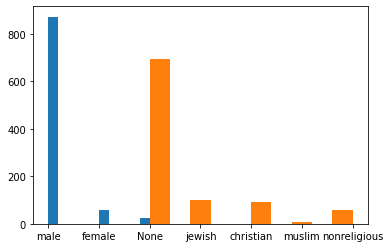

In [ ]:
import matplotlib.pyplot as plt
plt.hist(df.gender)
plt.hist(df.religion)


Nous créons un fichier CSV comportant les données sur les statistiques (None pour celles non renseignées) après le regroupement des statistiques en un dataframe.

In [ ]:
df_statistiques = pd.DataFrame({'année':yearsout, 'nombre_analphabètes_femmes':numbersf, 'nombre_analphabètes_hommes':numbersm, 'poucentage_analphabètes_femmes':pourcentages, 'nombre_femmes_déscolarisées':numbersoutf, 'nombre_hommes_déscolarisés':numbersoutm, 'nombre_chercheurs': numbers_researchers, 'pourcentages_femmes_chercheuses': pourcentage_researchersf})
df_statistiques.index=yearsout
df_statistiques.to_csv('statistiques.csv')

On crée le fichier CSV concernant les informations sur les comités Nobel.

In [ ]:
#pour cela on crée différentes listes
dom = []
noms = []
deb = []
fin = []

for i in range(len(domaines)):
  for membre in comites[i]:
    dom.append(domaines[i])
    noms.append(membre[0])
    deb.append(membre[1])
    fin.append(membre[2])

#puis on crée le dataframe
df_comites = pd.DataFrame({'domaine':dom, 'nom':noms, 'début_mandat':deb, 'fin_mandat':fin})

df_comites.head()
#puis le fichier csv
df_comites.to_csv('comites.csv')

##Quelques statistiques descriptives sur les données...

Nous allons ici afficher sous forme de graphique la répartition des femmes parmi les lauréats du Prix Nobel, par année et par catégorie.

In [ ]:
annees = []

for personne in laureates:
    if 'gender' in personne:
        if personne['gender']=='female':
            #print(personne)
            for i in range(len(personne['nobelPrizes'])):  #une personne peut recevoir plusieurs prix Nobel
                annee = personne['nobelPrizes'][i]['awardYear']
                annees.append(int(annee))

print(annees)
print(str(len(annees))+" prix Nobel obtenus par des femmes")

NameError: ignored

In [ ]:
import matplotlib.pyplot as plt

plt.title("Nomre de femmes lauréates en fontion des années")
plt.hist(annees, bins=2021-1901)
axes = plt.gca()
axes.set_xlabel("années")
axes.set_ylabel("nombre de lauréates")
plt.show()

'Chemistry'

Nous essayons de visualiser les informations statistiques sur notre dataframe en utilisant la fonction describe().

In [ ]:
df_statistiques.describe()

,année,nombre_analphabètes_femmes,nombre_analphabètes_hommes,poucentage_analphabètes_femmes,nombre_femmes_déscolarisées,nombre_hommes_déscolarisés,nombre_chercheurs,pourcentages_femmes_chercheuses
count,50,50,50,50,50,50,50,50
unique,50,46,46,46,50,50,24,50
top,1996,None,None,None,202706661,173210902,None,62.31274
freq,1,5,5,5,1,1,27,1
